# Projeto de criação de uma base de dados e treinamento da rede YOLO

## Resumo do Desafio
Este projeto visa atender a um desafio de visão computacional que consiste em treinar um modelo da família YOLO para detectar classes de objetos personalizadas.
<br>Os requisitos principais são:
1.  **Utilizar a rede YOLO**.
2.  **Criar e usar uma base de dados própria** com pelo menos duas classes.
3.  **Realizar o retreinamento (transfer learning)** a partir de um modelo pré-treinado.

Este notebook documenta todas as etapas, desde a configuração do ambiente até a análise dos resultados, demonstrando como cada requisito foi cumprido.

## 1. Configuração do Ambiente e Importação de Bibliotecas

A primeira etapa consiste em importar a biblioteca `ultralytics`, que contém a implementação do modelo YOLO que utilizaremos. <br>Também importamos a classe `YOLO` para facilitar o acesso ao modelo e a biblioteca matplotlib para visualizarmos os resultados da predição ao final do notebook.

In [1]:
from ultralytics import YOLO
from matplotlib import pyplot as plt

In [2]:
%matplotlib inline

## 2. Carregamento e Treinamento do Modelo YOLOv11

Nesta seção, realizamos a etapa mais crucial do projeto, que atende a todos os requisitos do desafio simultaneamente.

### 2.1. Escolha do Modelo e Transfer Learning
- **Atendendo ao requisito de usar YOLO:** Selecionamos o `yolo11n.pt`, a versão "nano" (mais leve e rápida) da mais recente família de modelos YOLOv11.
- O uso de um arquivo `.pt` pré-treinado caracteriza o **Transfer Learning**. O modelo já possui um vasto conhecimento sobre como detectar formas e texturas, aprendido com o dataset COCO. Nós transferimos esse conhecimento e o especializamos para detectar nossas novas classes.

### 2.2. Uso do Dataset Personalizado
- **Atendendo ao requisito de criar um dataset:** O treinamento aponta para o arquivo `data='dataset.yaml'`. Este arquivo de configuração descreve nosso dataset próprio, que contém as duas novas classes para detecção: `capacete` e `extintor`.

### 2.3. Aumento de Dados (Data Augmentation)
Para tornar nosso modelo mais robusto e melhorar sua capacidade de generalização (especialmente o `recall`), aplicamos técnicas de aumento de dados:
- `fliplr=0.75`: Aumentamos a probabilidade de inverter as imagens horizontalmente para 75%.
- `degrees=10.0`: Permitimos rotações aleatórias de até 10 graus.
- `translate=0.15`: Permitimos que as imagens sejam movidas aleatoriamente em até 15%.

In [3]:
# 1. Carrega o modelo YOLOv11 pré-treinado. 
#    Esta é a base do nosso Transfer Learning.
model = YOLO('yolo11n.pt') 

# 2. Inicia o treinamento do modelo.
#    Esta única linha de código executa todo o processo.
results = model.train(
   # --- Parâmetros Essenciais ---
   data='dataset.yaml',      # Aponta para o nosso dataset personalizado (Requisito do Desafio)
   epochs=100,               # Número de vezes que o modelo verá o dataset completo
   imgsz=640,                # Redimensiona todas as imagens para 640x640 pixels
   
   # --- Parâmetros de Aumento de Dados (Data Augmentation) ---
   fliplr=0.75,              # Probabilidade de inversão horizontal da imagem
   degrees=10.0,             # Variação de rotação em graus
   translate=0.15,           # Variação de translação da imagem
    
   # --- Parâmetros de Execução ---
   name='yolo11n_capacete_extintor_final' # Nome descritivo para a pasta de resultados
)

New https://pypi.org/project/ultralytics/8.3.176 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.174  Python-3.9.23 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 3060, 12287MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=10.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.75, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11n_capacete_extintor_final, nbs=64, nms=False, opset=

train: Scanning C:\Users\edemi\dev\detecao-com-yolo\dataset\train\labels.cache... 224 images, 0 backgrounds, 0 corrupt: 100%|██████████| 224/224 [


val: Fast image access  (ping: 0.30.1 ms, read: 574.3179.1 MB/s, size: 2480.5 KB)


val: Scanning C:\Users\edemi\dev\detecao-com-yolo\dataset\val\labels.cache... 57 images, 0 backgrounds, 0 corrupt: 100%|██████████| 57/57 [00:00<?


Plotting labels to runs\detect\yolo11n_capacete_extintor_final\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\yolo11n_capacete_extintor_final
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.28G      1.762      3.841      1.465         35        640: 100%|██████████| 14/14 [01:05<00:00,  4.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.41s/it]

                   all         57         78    0.00261      0.567      0.107     0.0459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.74G      1.462       2.91      1.336         40        640: 100%|██████████| 14/14 [01:26<00:00,  6.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.81it/s]

                   all         57         78    0.00319      0.712      0.168      0.095



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.74G      1.496      2.675      1.336         35        640: 100%|██████████| 14/14 [00:37<00:00,  2.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all         57         78    0.00271      0.606      0.186     0.0814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.75G      1.389      2.466       1.27         35        640: 100%|██████████| 14/14 [00:10<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]

                   all         57         78    0.00266      0.538      0.186     0.0864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.75G      1.474      2.306      1.368         37        640: 100%|██████████| 14/14 [00:11<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]

                   all         57         78      0.472      0.154      0.164     0.0857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.75G       1.45      2.207      1.348         44        640: 100%|██████████| 14/14 [00:11<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]

                   all         57         78      0.229      0.115      0.115     0.0485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.75G      1.454      2.114      1.325         27        640: 100%|██████████| 14/14 [00:11<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.96it/s]

                   all         57         78      0.745      0.144      0.241      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.75G      1.536        2.1      1.377         38        640: 100%|██████████| 14/14 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]

                   all         57         78      0.851      0.183      0.222      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.75G      1.522      2.029      1.343         52        640: 100%|██████████| 14/14 [00:13<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.89it/s]

                   all         57         78      0.403      0.154      0.186     0.0796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.75G      1.536      1.987      1.377         29        640: 100%|██████████| 14/14 [00:07<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         57         78      0.398      0.449      0.318      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.75G      1.473      1.847      1.371         54        640: 100%|██████████| 14/14 [00:09<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.82it/s]

                   all         57         78      0.341      0.442      0.336      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.75G      1.434      1.739      1.305         35        640: 100%|██████████| 14/14 [00:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         57         78      0.415      0.407      0.324      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.75G      1.452      1.709      1.385         52        640: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         57         78      0.476      0.346      0.369      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.75G      1.467      1.768      1.346         50        640: 100%|██████████| 14/14 [00:07<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         57         78       0.75      0.314      0.358      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.75G      1.421      1.636        1.3         35        640: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]

                   all         57         78      0.629      0.385      0.455      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.75G      1.448       1.57      1.314         37        640: 100%|██████████| 14/14 [00:14<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]

                   all         57         78      0.715       0.42      0.505      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.75G      1.399      1.613      1.313         38        640: 100%|██████████| 14/14 [00:11<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.85it/s]

                   all         57         78      0.661      0.427      0.491      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.75G       1.41      1.553      1.323         41        640: 100%|██████████| 14/14 [00:05<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         57         78      0.684        0.4      0.493      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.75G       1.36      1.469      1.271         43        640: 100%|██████████| 14/14 [00:11<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.03it/s]

                   all         57         78      0.575      0.448      0.507      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.75G      1.397      1.481      1.291         45        640: 100%|██████████| 14/14 [00:11<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         57         78      0.788      0.389      0.511      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.75G      1.376      1.471      1.271         52        640: 100%|██████████| 14/14 [00:06<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         57         78      0.682      0.496      0.484      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.75G      1.388      1.346      1.285         36        640: 100%|██████████| 14/14 [00:14<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         57         78      0.762      0.385      0.544      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.75G      1.406      1.398      1.319         38        640: 100%|██████████| 14/14 [00:09<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         57         78      0.675        0.5      0.559      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.75G      1.312      1.284      1.216         51        640: 100%|██████████| 14/14 [00:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         57         78      0.601      0.538      0.568      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.75G      1.345      1.331      1.228         43        640: 100%|██████████| 14/14 [00:10<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         57         78      0.798      0.471      0.582       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.75G      1.275      1.246      1.189         40        640: 100%|██████████| 14/14 [00:12<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         57         78      0.747       0.54      0.613      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.75G      1.277      1.204      1.213         31        640: 100%|██████████| 14/14 [00:08<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]

                   all         57         78      0.825      0.511       0.59      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.75G      1.254      1.222      1.229         44        640: 100%|██████████| 14/14 [00:11<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         57         78      0.854       0.52      0.607      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.75G      1.245      1.189      1.194         38        640: 100%|██████████| 14/14 [00:11<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         57         78      0.751      0.493      0.574      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.75G      1.282      1.184      1.232         42        640: 100%|██████████| 14/14 [00:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         57         78       0.81      0.542       0.59      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.75G      1.224      1.176      1.232         34        640: 100%|██████████| 14/14 [00:09<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         57         78      0.856      0.569      0.601      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.75G      1.186      1.098       1.18         38        640: 100%|██████████| 14/14 [00:07<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         57         78      0.741      0.548      0.603      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.75G      1.222       1.14      1.226         50        640: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]

                   all         57         78      0.827      0.529       0.64      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.75G      1.218      1.147      1.168         40        640: 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         57         78      0.688      0.519      0.542      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.75G      1.192      1.073      1.175         39        640: 100%|██████████| 14/14 [00:08<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         57         78      0.562      0.529       0.54      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.75G      1.173      1.052      1.175         43        640: 100%|██████████| 14/14 [00:08<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         57         78      0.873      0.529      0.634      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.75G      1.174      1.068      1.173         32        640: 100%|██████████| 14/14 [00:11<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]

                   all         57         78      0.686      0.583      0.607      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.75G      1.174      1.017      1.186         40        640: 100%|██████████| 14/14 [00:10<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]

                   all         57         78      0.667      0.635      0.664      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.75G      1.217      1.078      1.184         32        640: 100%|██████████| 14/14 [00:11<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         57         78      0.764      0.639      0.703      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.75G      1.204      1.053      1.184         53        640: 100%|██████████| 14/14 [00:09<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         57         78      0.859      0.471      0.606      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.75G      1.201      1.023      1.162         34        640: 100%|██████████| 14/14 [00:08<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.09it/s]

                   all         57         78      0.708       0.56      0.627      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.75G      1.131     0.9233      1.145         31        640: 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         57         78      0.898      0.555      0.694      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.75G      1.133     0.9739      1.135         39        640: 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all         57         78       0.67      0.567      0.582      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.75G      1.089     0.8964      1.096         40        640: 100%|██████████| 14/14 [00:06<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         57         78      0.799       0.56      0.643      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.75G      1.104     0.9171      1.133         40        640: 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         57         78      0.738      0.585      0.659      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.75G      1.136     0.9513      1.156         33        640: 100%|██████████| 14/14 [00:11<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         57         78      0.863        0.5      0.624      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.75G      1.126     0.9248      1.153         43        640: 100%|██████████| 14/14 [00:08<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.89it/s]

                   all         57         78      0.774      0.563      0.648      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.75G      1.098     0.8935      1.136         30        640: 100%|██████████| 14/14 [00:07<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         57         78      0.852      0.521      0.676      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.75G      1.084     0.9337      1.126         45        640: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         57         78      0.699      0.628      0.685      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.75G      1.091     0.8585      1.117         32        640: 100%|██████████| 14/14 [00:08<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         57         78      0.882      0.585      0.684       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.75G        1.1     0.8808      1.112         42        640: 100%|██████████| 14/14 [00:11<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         57         78      0.806      0.557      0.664       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.75G      1.033     0.8426       1.09         38        640: 100%|██████████| 14/14 [00:11<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]

                   all         57         78       0.77      0.569        0.7      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.75G      1.017     0.8506       1.09         44        640: 100%|██████████| 14/14 [00:09<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         57         78      0.696      0.678      0.712      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.75G     0.9901     0.7905      1.071         37        640: 100%|██████████| 14/14 [00:07<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         57         78      0.715      0.583      0.652      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.75G      1.054     0.8476      1.102         45        640: 100%|██████████| 14/14 [00:08<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         57         78        0.8      0.572      0.668      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.75G      1.041      0.829       1.09         47        640: 100%|██████████| 14/14 [00:09<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]

                   all         57         78      0.732      0.577      0.651      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.75G       1.03     0.7994      1.084         32        640: 100%|██████████| 14/14 [00:12<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         57         78      0.829      0.537      0.652      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.75G      1.001     0.7508      1.052         32        640: 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.83it/s]

                   all         57         78      0.719      0.625      0.691      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.75G      1.022     0.7811       1.08         34        640: 100%|██████████| 14/14 [00:05<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         57         78       0.79      0.659      0.721      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.75G      0.992     0.7667      1.053         40        640: 100%|██████████| 14/14 [00:12<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         57         78      0.817      0.656      0.727      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.75G     0.9956     0.7798      1.078         38        640: 100%|██████████| 14/14 [00:10<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         57         78      0.741      0.633      0.688      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.75G     0.9663     0.7645      1.051         52        640: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]

                   all         57         78      0.804      0.576      0.693      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.75G     0.9587     0.7421      1.052         55        640: 100%|██████████| 14/14 [00:08<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         57         78      0.768      0.644      0.695       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.75G     0.9455      0.726      1.027         40        640: 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         57         78      0.754       0.67      0.679      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.75G     0.9648     0.7796       1.08         23        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.85it/s]

                   all         57         78      0.718      0.686      0.707      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.75G     0.9778     0.7423       1.06         40        640: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         57         78      0.751      0.654       0.72       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.75G     0.9674     0.7414      1.077         31        640: 100%|██████████| 14/14 [00:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         57         78      0.814      0.604      0.734       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.75G     0.9144     0.6874      1.013         41        640: 100%|██████████| 14/14 [00:13<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         57         78      0.793      0.685      0.731      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.75G     0.9176      0.706      1.023         32        640: 100%|██████████| 14/14 [00:08<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         57         78      0.775      0.674      0.737      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.75G     0.8922     0.6849      1.018         40        640: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         57         78      0.857      0.669      0.754      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.75G     0.8969     0.6915       1.02         55        640: 100%|██████████| 14/14 [00:13<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]

                   all         57         78      0.938      0.606      0.746      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.75G     0.9653     0.7143      1.053         29        640: 100%|██████████| 14/14 [00:10<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.72it/s]

                   all         57         78       0.81      0.654      0.721      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.75G     0.9354     0.6939      1.052         37        640: 100%|██████████| 14/14 [00:07<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         57         78      0.879      0.628      0.723      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.75G     0.8858     0.6399     0.9853         40        640: 100%|██████████| 14/14 [00:11<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         57         78      0.809      0.663      0.733      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.75G     0.8955     0.6829      1.023         44        640: 100%|██████████| 14/14 [00:11<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         57         78      0.772      0.658      0.745      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.75G     0.9252     0.6918      1.034         35        640: 100%|██████████| 14/14 [18:48<00:00, 80.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]

                   all         57         78      0.739      0.644      0.722      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.75G     0.9377     0.6964      1.045         61        640: 100%|██████████| 14/14 [00:11<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]

                   all         57         78      0.785      0.663      0.746      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.75G     0.8537     0.6518      1.009         38        640: 100%|██████████| 14/14 [00:14<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         57         78      0.734      0.692      0.744      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.75G       0.86     0.6251     0.9914         48        640: 100%|██████████| 14/14 [00:16<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.71it/s]

                   all         57         78      0.776      0.631      0.732      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.75G     0.9044     0.6772      1.006         24        640: 100%|██████████| 14/14 [00:25<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]

                   all         57         78      0.796      0.595      0.693      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.75G     0.8136     0.6102     0.9677         48        640: 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.98it/s]

                   all         57         78      0.825      0.589      0.703      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.75G     0.8515     0.6383      1.009         29        640: 100%|██████████| 14/14 [00:14<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         57         78      0.747      0.625      0.718      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.75G     0.8773     0.6527      1.007         54        640: 100%|██████████| 14/14 [00:14<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         57         78      0.769      0.642      0.721      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.75G     0.8518     0.6318      1.005         43        640: 100%|██████████| 14/14 [00:20<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         57         78      0.728      0.648      0.725      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.75G     0.8421     0.6192     0.9843         33        640: 100%|██████████| 14/14 [00:15<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         57         78      0.717      0.659      0.726      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.75G     0.8331     0.6144      1.011         39        640: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.00it/s]

                   all         57         78      0.728      0.635      0.716      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.75G     0.8159     0.6391     0.9916         36        640: 100%|██████████| 14/14 [00:10<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.50it/s]

                   all         57         78      0.726      0.629      0.718      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.75G     0.7922      0.619     0.9887         36        640: 100%|██████████| 14/14 [00:24<00:00,  1.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         57         78      0.792       0.62      0.715      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.75G     0.7947     0.6217     0.9842         58        640: 100%|██████████| 14/14 [00:14<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         57         78      0.765      0.644      0.707      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.75G     0.8186     0.6211      1.017         30        640: 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         57         78      0.793      0.616      0.715      0.461


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.75G     0.7503     0.6028     0.9364         29        640: 100%|██████████| 14/14 [00:26<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         57         78      0.778      0.625       0.72       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.75G     0.7844     0.5736     0.9741         20        640: 100%|██████████| 14/14 [00:19<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]

                   all         57         78      0.784       0.64      0.713      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.75G     0.7299     0.5569       0.93         20        640: 100%|██████████| 14/14 [00:19<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.96it/s]

                   all         57         78      0.775      0.657      0.714      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.75G     0.7175     0.5184     0.9286         23        640: 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         57         78       0.78      0.642      0.745      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.75G     0.7741     0.5203     0.9393         21        640: 100%|██████████| 14/14 [00:16<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         57         78      0.779      0.634      0.741      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.75G     0.7573     0.5332     0.9603         20        640: 100%|██████████| 14/14 [00:14<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         57         78      0.774      0.635      0.736      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.75G     0.7219     0.5047     0.9391         17        640: 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         57         78      0.809      0.625      0.739      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.75G     0.6995     0.5081     0.9343         18        640: 100%|██████████| 14/14 [00:10<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.73it/s]

                   all         57         78      0.821      0.628       0.74      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.75G     0.6766     0.4853     0.9176         20        640: 100%|██████████| 14/14 [00:15<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.70it/s]

                   all         57         78      0.824      0.635       0.74      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.75G     0.7139     0.5058     0.9295         24        640: 100%|██████████| 14/14 [00:12<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]

                   all         57         78      0.825      0.634      0.732      0.478



100 epochs completed in 0.746 hours.
Optimizer stripped from runs\detect\yolo11n_capacete_extintor_final\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\yolo11n_capacete_extintor_final\weights\best.pt, 5.5MB

Validating runs\detect\yolo11n_capacete_extintor_final\weights\best.pt...
Ultralytics 8.3.174  Python-3.9.23 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 3060, 12287MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]


                   all         57         78      0.824      0.637      0.741      0.478
              capacete         17         26      0.821      0.538      0.636      0.468
              extintor         40         52      0.827      0.735      0.846      0.488
Speed: 0.3ms preprocess, 5.9ms inference, 0.0ms loss, 5.0ms postprocess per image
Results saved to runs\detect\yolo11n_capacete_extintor_final


## 3. Análise dos Resultados

Após o treinamento, o `ultralytics` salva automaticamente todos os resultados, incluindo pesos do modelo e gráficos de performance, na pasta `runs/detect/`.

A análise dos resultados, especialmente da Matriz de Confusão e das métricas `mAP50`, `Precision` e `Recall`, nos permite avaliar o sucesso do nosso treinamento.

- **mAP50 (Mean Average Precision):** É a nossa principal métrica de performance. Um valor alto indica que o modelo é bom tanto em localizar os objetos quanto em classificá-los corretamente.
- **Precision (Precisão):** Indica a confiabilidade do modelo. Uma precisão alta significa que, quando o modelo faz uma detecção, ele raramente está errado.
- **Recall (Revocação):** Indica a capacidade do modelo de encontrar todos os objetos existentes. Um recall alto significa que o modelo deixa poucos objetos passarem despercebidos.

Os resultados obtidos mostraram uma excelente `Precision` e um `mAP50` robusto, indicando que o modelo aprendeu com sucesso a detectar os novos objetos.

## 4. Conclusão

O treinamento foi concluído com sucesso e **todos os requisitos do desafio foram atendidos**:

- **[✓] Rede YOLO utilizada:** Optamos pelo moderno e eficiente YOLOv11.
- **[✓] Base de dados própria criada:** Utilizamos um dataset com as classes `capacete` e `extintor`, configurado através do `dataset.yaml`.
- **[✓] Retreinamento realizado:** Aplicamos a técnica de Transfer Learning a partir de um modelo pré-treinado no COCO, especializando-o para nossas necessidades.

O modelo final é rápido, preciso e capaz de detectar os equipamentos de segurança definidos, estando pronto para ser implantado em aplicações práticas.

## Predição (BÔNUS)
Foram treinadas as classes `capacete` e `extintor` e agora vamos tentar a predição com algumas imagens.

In [4]:
source = 'images'

In [9]:
results = model.predict(source=source)


image 1/20 C:\Users\edemi\dev\detecao-com-yolo\images\alarm-316544_640.jpg: 448x640 2 extintors, 38.4ms
image 2/20 C:\Users\edemi\dev\detecao-com-yolo\images\alarm-316545_640.jpg: 448x640 1 extintor, 41.0ms
image 3/20 C:\Users\edemi\dev\detecao-com-yolo\images\cap01.jpg: 480x640 1 capacete, 38.4ms
image 4/20 C:\Users\edemi\dev\detecao-com-yolo\images\cap02.jpg: 640x416 1 capacete, 25.8ms
image 5/20 C:\Users\edemi\dev\detecao-com-yolo\images\cap03.jpg: 480x640 1 capacete, 34.7ms
image 6/20 C:\Users\edemi\dev\detecao-com-yolo\images\cap10.jpg: 448x640 1 capacete, 26.0ms
image 7/20 C:\Users\edemi\dev\detecao-com-yolo\images\cockpit-2324610_1280.jpg: 448x640 1 extintor, 36.7ms
image 8/20 C:\Users\edemi\dev\detecao-com-yolo\images\dortmund-1626921_1280.jpg: 448x640 2 extintors, 38.2ms
image 9/20 C:\Users\edemi\dev\detecao-com-yolo\images\extinguisher-237643_1280.jpg: 640x384 1 extintor, 32.9ms
image 10/20 C:\Users\edemi\dev\detecao-com-yolo\images\extinguisher-348618_1280.jpg: 640x448 1 ex

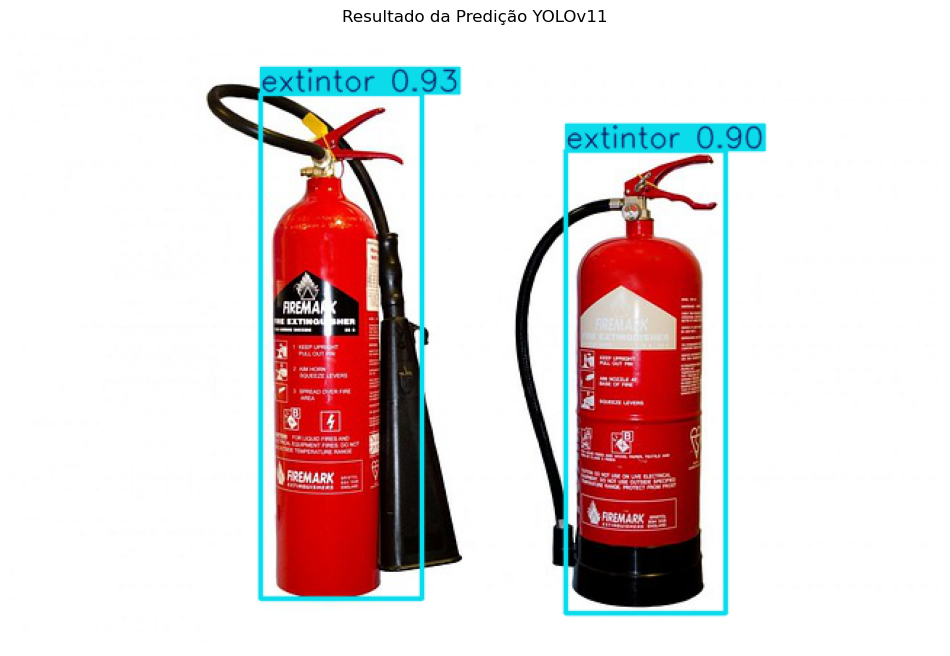

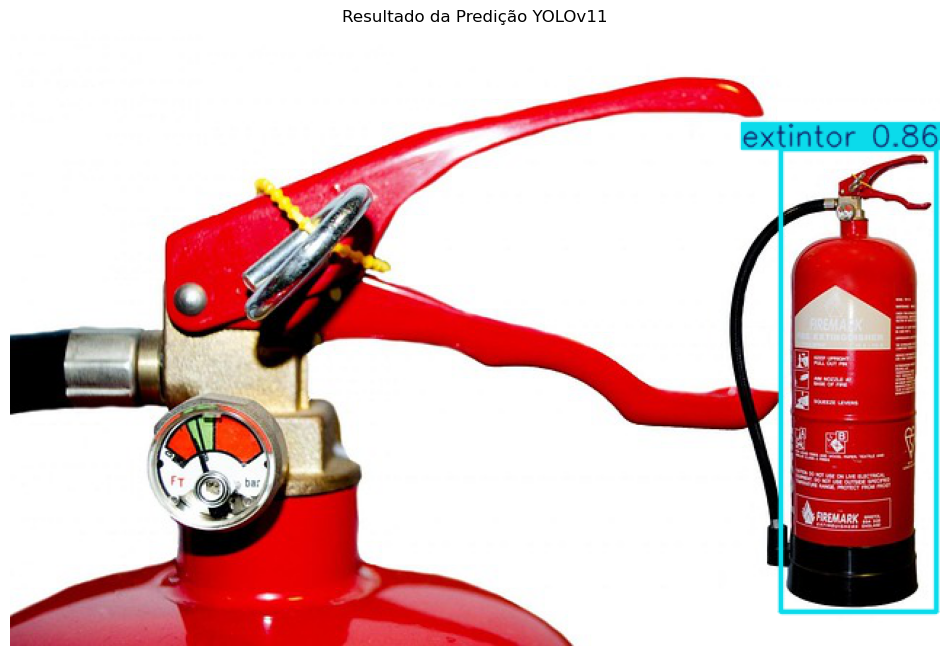

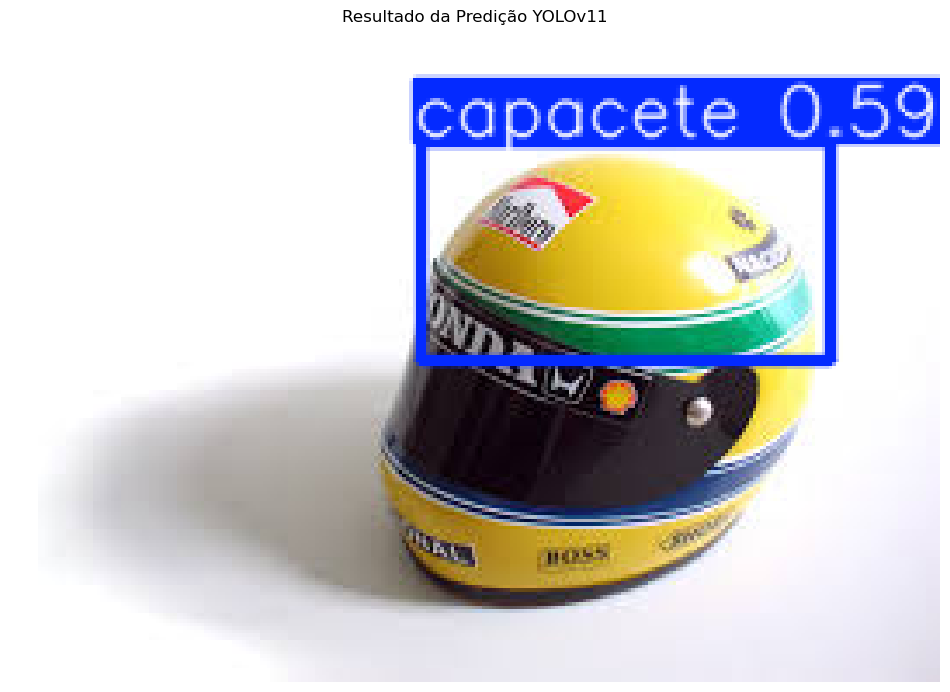

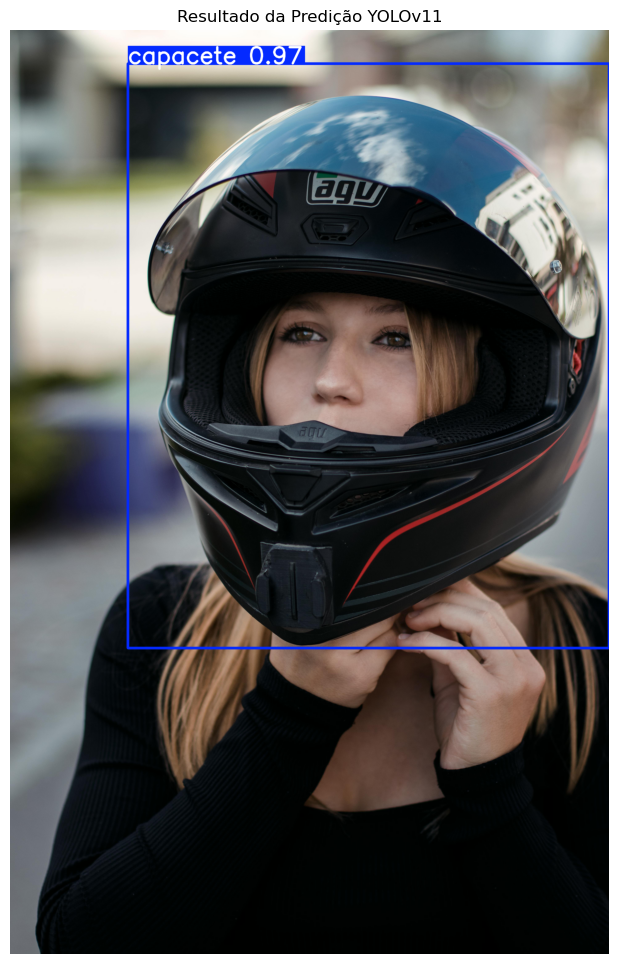

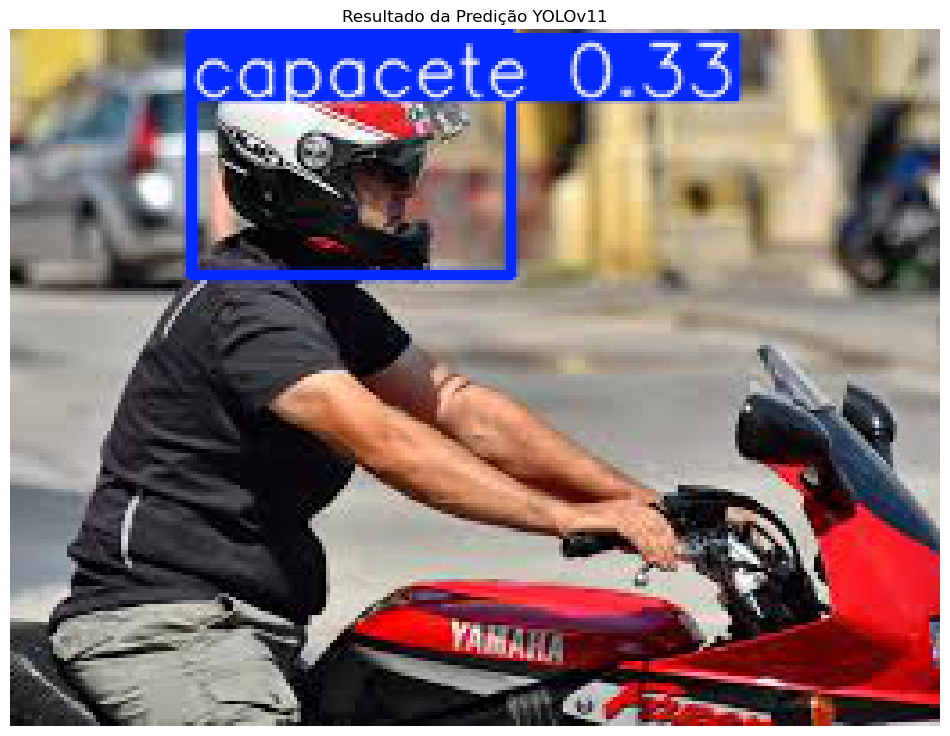

...

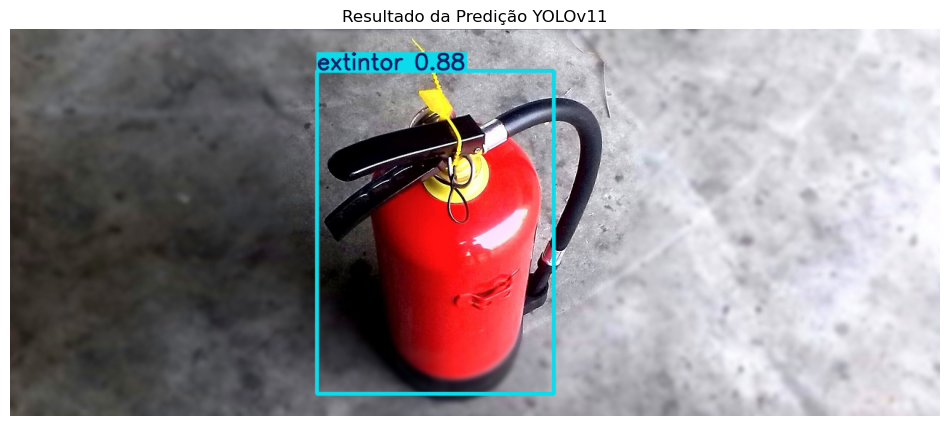

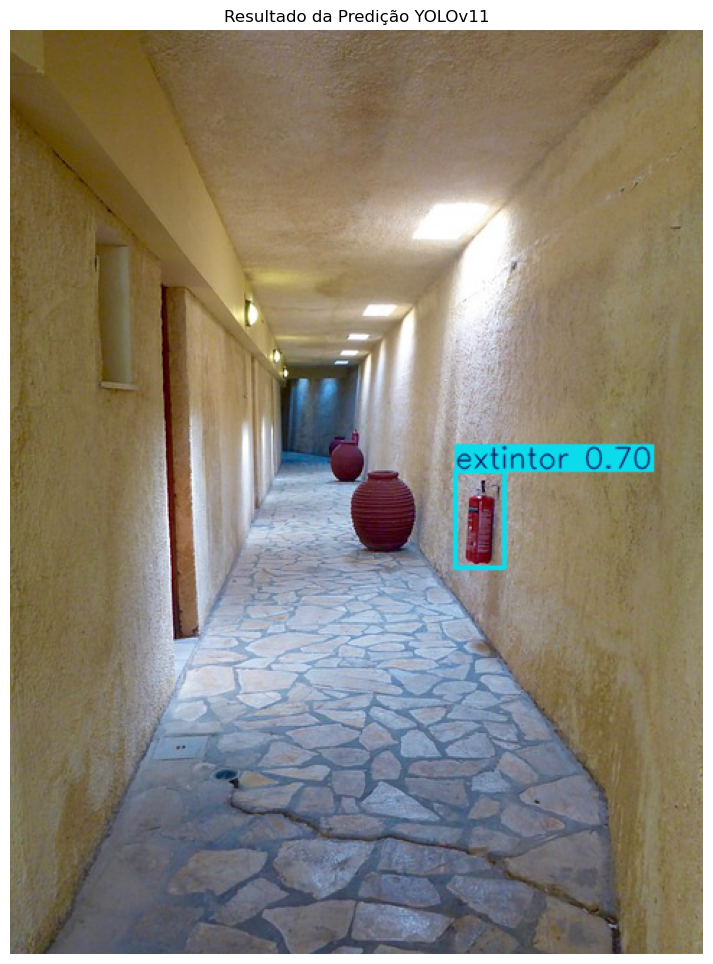

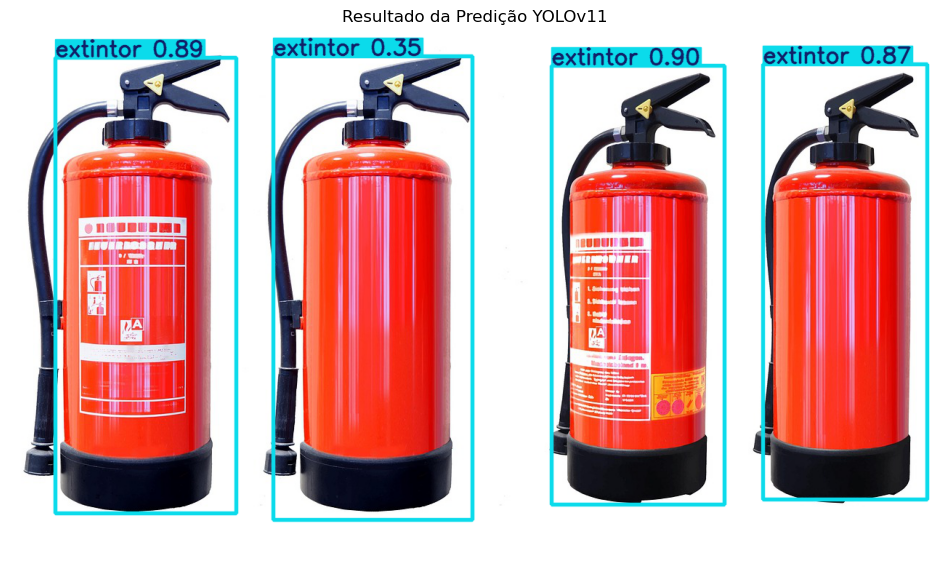

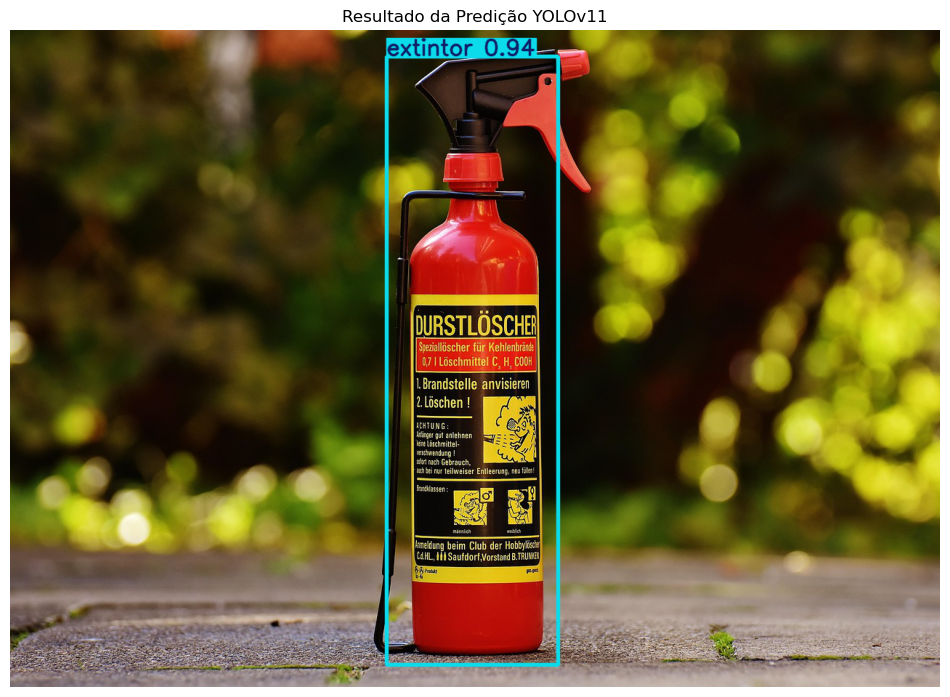

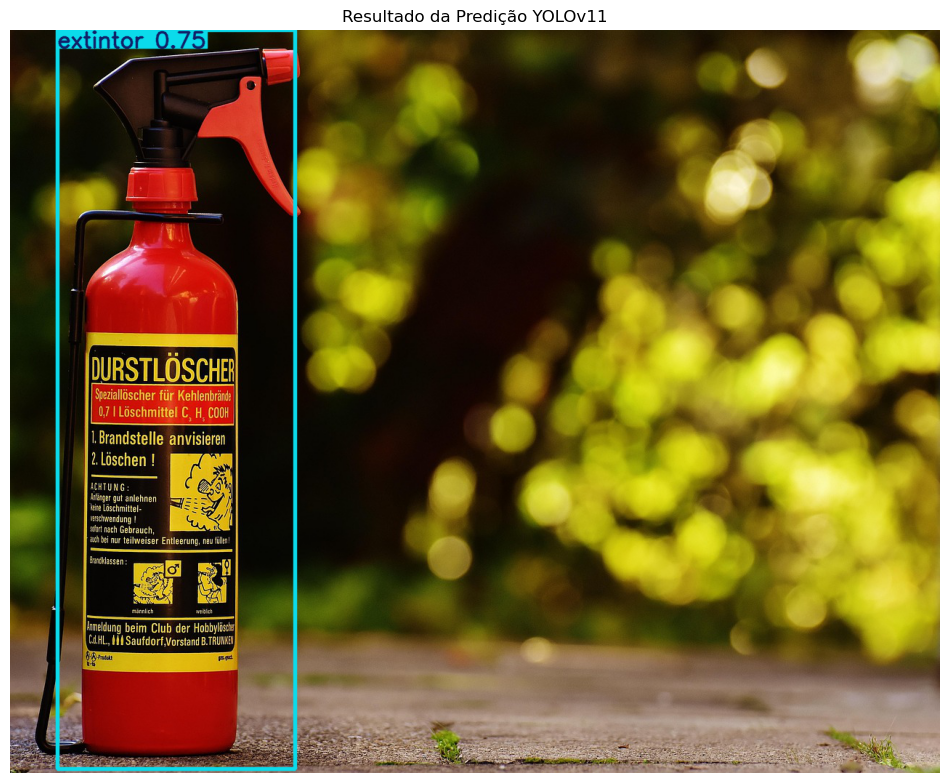

In [10]:
# Itere sobre os resultados
for result in results:
    # O método .plot() retorna um array NumPy com as anotações
    img_array = result.plot()  

    # Converta o array BGR para RGB para exibição correta com Matplotlib
    # Isso é feito invertendo a ordem do último eixo (os canais de cor)
    img_rgb = img_array[..., ::-1]

    # Crie uma figura e eixos com Matplotlib
    plt.figure(figsize=(12, 12))
    plt.imshow(img_rgb)
    plt.title("Resultado da Predição YOLOv11")
    plt.axis('off') # Opcional: remove os eixos para uma visualização mais limpa
    plt.show()